# data

In [1]:
# datadir='/Users/keerthi/Documents/work/htic/hbp/data/public/dsb2018/stage1_train'
datadir = '/data/public/dsb2018/stage1_train'

In [2]:
# os.getcwd()

In [10]:
import glob
import os
import json

In [75]:
imglist = os.listdir(datadir)

In [76]:
len(imglist)

670

In [77]:
imglist[:10]

['00071198d059ba7f5914a526d124d28e6d010c92466da21d4a04cd5413362552',
 '003cee89357d9fe13516167fd67b609a164651b21934585648c740d2c3d86dc1',
 '00ae65c1c6631ae6f2be1a449902976e6eb8483bf6b0740d00530220832c6d3e',
 '0121d6759c5adb290c8e828fc882f37dfaf3663ec885c663859948c154a443ed',
 '01d44a26f6680c42ba94c9bc6339228579a95d0e2695b149b7cc0c9592b21baf',
 '0280fa8f60f6bcae0f97d93c28f60be194f9309ff610dc5845e60455b0f87c21',
 '0287e7ee5b007c91ae2bd7628d09735e70496bc6127ecb7f3dd043e04ce37426',
 '02903040e19ddf92f452907644ad3822918f54af41dd85e5a3fe3e1b6d6f9339',
 '03398329ced0c23b9ac3fac84dd53a87d9ffe4d9d10f1b5fe8df8fac12380776',
 '03b9306f44e9b8951461623dcbd615550cdcf36ea93b203f2c8fa58ed1dffcbe']

In [13]:
imgname = lambda n: glob.glob(datadir+'/'+imglist[n]+'/images/*.png')[0]

In [14]:
msklist = lambda n: glob.glob(datadir+'/'+imglist[n]+'/masks/*.png')

In [15]:
# from PIL import Image
from matplotlib import pyplot as plt
import numpy as np
from skimage.future.graph import RAG
from skimage.io import imread
from skimage.measure import regionprops_table
import pandas as pd
import networkx
from sklearn.metrics import confusion_matrix

In [16]:
def load_image(imgno,with_mask=True):
    imgpath = imgname(imgno)
    maskpaths = []
    if with_mask:
        maskpaths = msklist(imgno)
    
    img = imread(imgpath)
    shp = img.shape
    msk_lbl = np.zeros((shp[0],shp[1]),'uint16')
    
    
    for inst in range(len(maskpaths)):
        msk = maskpaths[inst]
        msk_i = imread(msk)
        msk_lbl[msk_i>0]=inst+1
    
    return img, msk_lbl
    

In [78]:
img,lbl = load_image(2)

In [79]:
lbl.max()

70

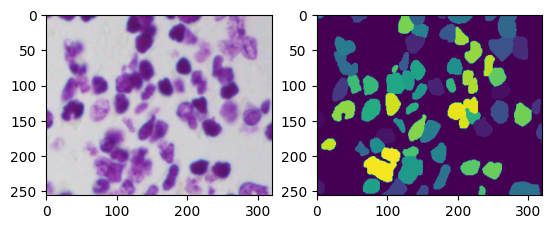

In [80]:
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(lbl)

In [20]:
lbl.shape

(256, 320)

# functions

In [21]:
nx=networkx

class InvalidKColoringError(Exception):
    """Raised when the k-coloring does not exist"""
    pass

class NoSolutionException(Exception):
    """Raised when no solution is found"""
    pass

def greedy_k_color(graph: nx.Graph, k: int, fair: bool = False) -> dict:
    """
    Greedy algorithm to find a k-coloring for a given graph.
    If fair, Chooses available colors by least frequency of occurrence.
    If not fair, the NetworkX greedy color with the strategy largest_first is used as a basis. This is extended \
        by selecting the most used color and divide it 50:50 with a new color. \
        That is repeated until all colors are used \
    Raises NoSolutionException if the algorithm can not find coloring for the given k.
    :param graph: NetworkX graph
    :param k: Number of colors
    :param fair: Tries to assign colors equitably. Caution: There might be solutions with fair = False but no solution \
        with fair = True
    :return: Color assignment
    """
    if k > graph.number_of_nodes():
        raise InvalidKColoringError(f"Graph has no {k}-coloring as it only has {graph.number_of_nodes()} vertices")
    coloring = {}
    available_colors = {c: 0 for c in range(k)}
    nodes = sorted(graph, key=graph.degree) # , reverse=True)
    if fair:
        for u in nodes:
            # Set to keep track of colors of neighbours
            neighbour_colors = {coloring[v] for v in graph[u] if v in coloring}
            for color in dict(sorted(available_colors.items(), key=lambda item: item[1])):
                if color not in neighbour_colors:
                    available_colors[color] = available_colors[color] + 1
                    break
            else:
                raise NoSolutionException("No more colors")
            # Assign the new color to the current node.
            coloring[u] = color
    else:
        coloring = nx.greedy_color(graph)
        if max(coloring.values()) + 1 > k:
            raise NoSolutionException(f"Minimal solution needs more colors than k={k} < {max(coloring.values()) + 1}")

        for c in range(max(coloring.values()) + 1, k):
            color_dist = Counter(coloring.values())
            most_used_color = max(color_dist, key=color_dist.get)
            if color_dist[most_used_color] <= 1:
                raise NoSolutionException("Not possible to replace colors")
            nodes_with_most_used_color = [k for k, v in coloring.items() if v == most_used_color]
            replace_color_nodes = default_rng().choice(nodes_with_most_used_color,
                                                       size=math.floor(color_dist[most_used_color] / 2),
                                                       replace=False)
            for node in replace_color_nodes:
                coloring[node] = c

    return coloring

In [22]:
from skimage.segmentation import find_boundaries

def get_coloring(lbl, per_subgraph=True):
    # FIXME: per_subgraph will need to be ignored (true always)
    
    gr = RAG(lbl,connectivity=2)
    gr.remove_node(0)
    
    A = gr.adj
    islands = []
    for nd in gr.nodes:
        if gr.degree(nd)==0:
            islands.append(nd)
            
    [gr.remove_node(nd) for nd in islands]

    lbl_islands = np.where(np.logical_or.reduce([lbl==x for x in islands]), lbl, 0) 

    lbl_cl = np.zeros(lbl.shape,np.uint8) # 8 channel 
    
    shp = lbl.shape
    msk_2c = np.zeros((shp[0],shp[1],2),'bool')
    msk_2c[...,0] = lbl_islands>0
    
    
    if not per_subgraph:
        coloring = networkx.coloring.equitable_color(gr,min(8,max(dict(gr.degree).values())+1))
        
        for nd,cl in coloring.items():
            lbl_cl = np.where(lbl==nd,cl+2,lbl_cl)
    
        
    else:
        coloring = {}
        subgraphs=[gr.subgraph(comp).copy() for comp in networkx.connected_components(gr)]
        
        for subgr in subgraphs:
    
            sel = list(subgr)
            for x in sel:
                msk_2c[...,1] = msk_2c[...,1] | find_boundaries(lbl==x,mode='inner',connectivity=2)
                
            # grp = np.where(np.logical_or.reduce([lbl==x for x in sel]), lbl, 0) 
            if max(dict(subgr.degree).values())<3:
                coloring_sub = networkx.coloring.greedy_color(subgr,strategy='largest_first')
            else:
                nc = min(8,max(dict(subgr.degree).values())+1)
                # coloring_sub = networkx.coloring.equitable_color(subgr,nc)
                coloring_sub = greedy_k_color(subgr,nc,fair=True)
            
            for nd,cl in coloring_sub.items():
                lbl_cl = np.where(lbl==nd,cl+2,lbl_cl)
                
            coloring.update(coloring_sub)
            
    lbl_cl[lbl_islands>0]=1
    
    return lbl_cl, msk_2c, islands, gr, coloring

In [30]:
def to_onehot(lbl_cl,max_label=8):
    shp = lbl_cl.shape
    dims = shp[:2]
    if dims[0]==1:
        dims = shp[1:3]
    mx = lbl_cl.max()
    max_label=max(max_label,mx)
    oharray = np.zeros((dims[0],dims[1],max_label),dtype=np.uint8)
    for lv in range(1,mx+1):
        msk = lbl_cl==lv
        oharray[...,lv-1]=msk
    return oharray

In [24]:
from skimage.measure import regionprops, find_contours

def to_coco(lbl,coloring):
# if True:
    
    instances = []
    props = regionprops(lbl)
    for elt in props:
        r1,c1,r2,c2=elt.bbox
        clr = 0 if elt.label not in coloring else coloring[elt.label]
        # bound_img = find_boundaries(lbl==elt.label,mode='inner',connectivity=2)
        poly_rc = find_contours(lbl==elt.label)
        poly_xy = [np.flip(np.array(rc),axis=1).tolist() for rc in poly_rc]
        
        inst = {
            'label':elt.label,
            'bbox':[c1,r1,c2,r2],
            'bbox_mode':0, 
            'category_id':clr,
            'segmentation':poly_xy,
            # 'iscrowd':0,
            }
        instances.append(inst)
        
    return {
        'file_name':None, # filled by caller
        'height':lbl.shape[0], 'width':lbl.shape[1],
        'image_id':None, # filled by caller
        'annotations':instances
    }

In [145]:
im,lbl = load_image(32)

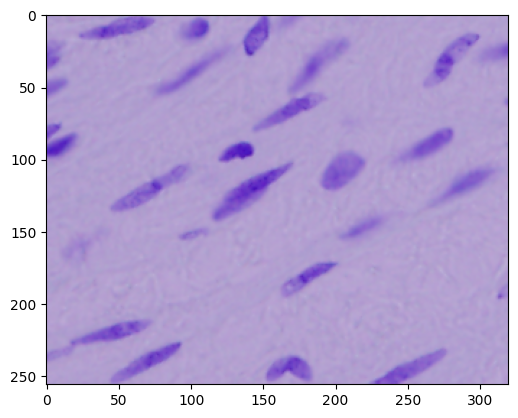

In [146]:
plt.imshow(im)

In [114]:
mean_r=[]
mean_g=[]
mean_b=[]
from tqdm import tqdm
for ii in tqdm(range(len(imglist))):
    im,lbl = load_image(ii)
    mean_r.append(im[...,0].mean())
    mean_g.append(im[...,1].mean())
    mean_b.append(im[...,2].mean())
        

100%|██████████| 670/670 [06:16<00:00,  1.78it/s]


In [117]:
mean_r[2],mean_g[2],mean_b[2]

(177.30477294921874, 154.22296142578125, 193.0249755859375)

In [126]:
mean_c=np.vstack((np.array(mean_r),np.array(mean_g),np.array(mean_b)))

In [127]:
mean_c.shape

(3, 670)

In [147]:
mean_c[:,(2,32)]

array([[177.30477295, 172.11622314],
       [154.22296143, 151.57249756],
       [193.02497559, 207.17625732]])

In [150]:
sel = np.nonzero( (mean_c[1]>150) & (mean_c[1]!=mean_c[0]))[0]

In [151]:
len(sel)

49

/tmp/ipykernel_101/3261221390.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


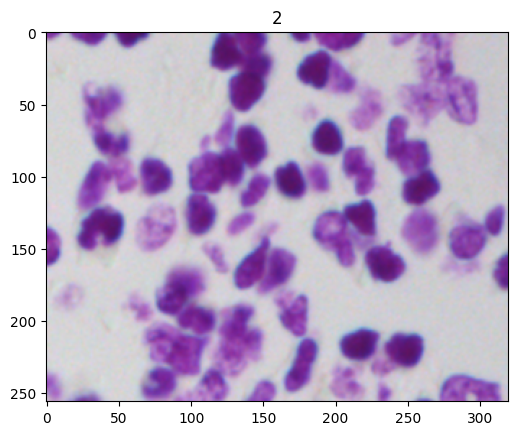

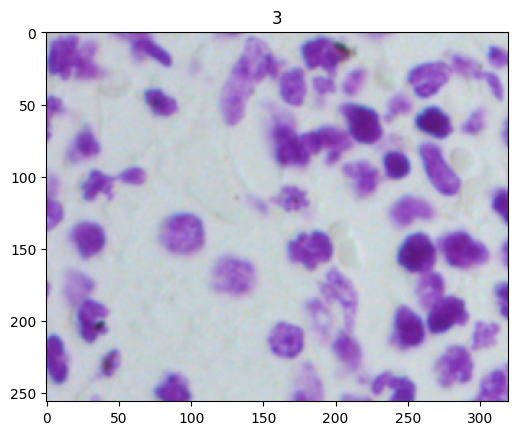

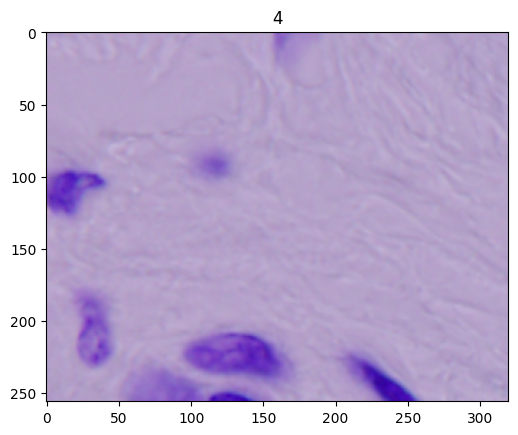

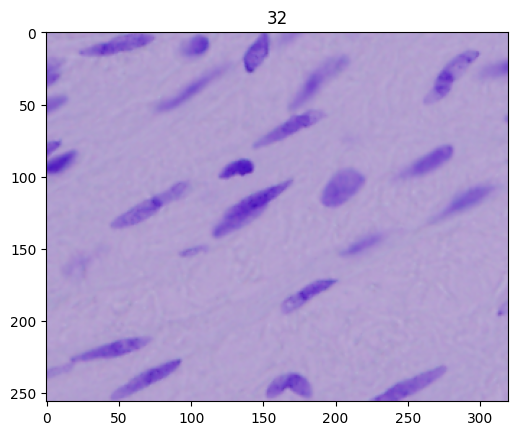

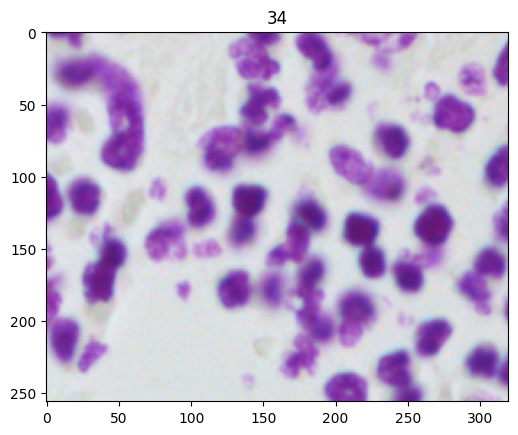

...

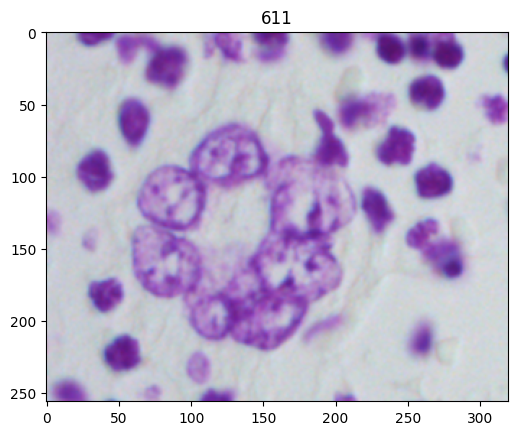

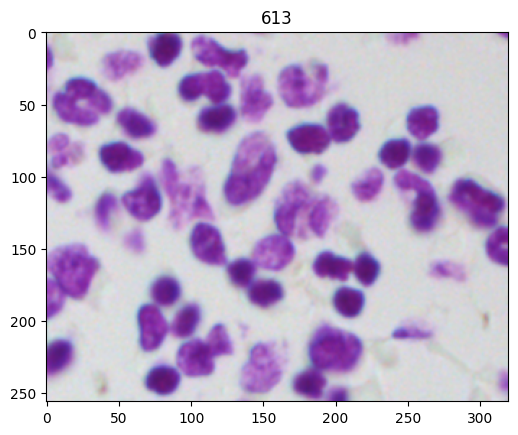

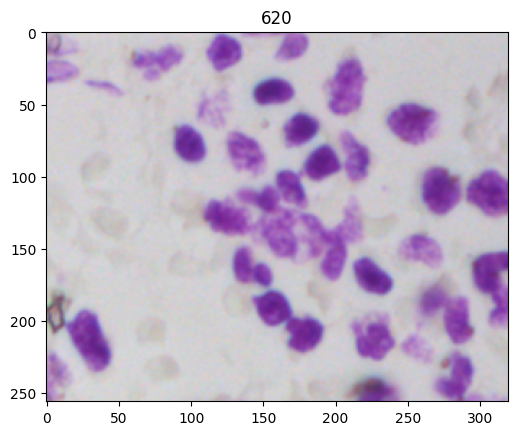

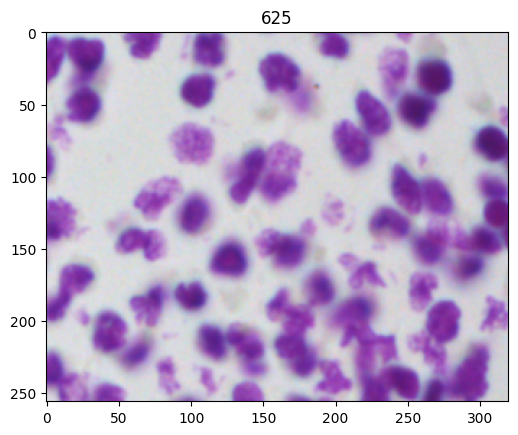

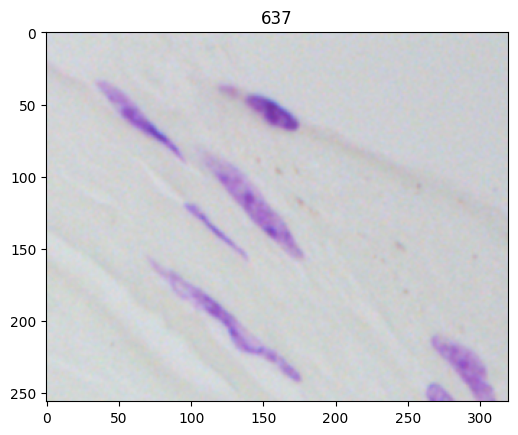

In [152]:
for ii in sel:#len(imglist)):
    im,lbl = load_image(ii)
    plt.figure()
    plt.imshow(im)
    plt.title(str(ii))

In [156]:
white=[2,3,34,40,55,58,76,83,119,139,146,177,214,230,259,268,308,319,327,339,383,388,389,
       416,430,449,463,473,496,515,592,611,613,620,625,637]
imgid = 473
img,lbl = load_image(imgid)

lbl_cl, msk_2c, islands, gr, coloring = get_coloring(lbl)
networkx.write_adjlist(gr,f'gr_{imgid}.adjlist')
json.dump({str(nd):str(clr) for nd,clr in coloring.items()},open(f'gr_{imgid}.coloring.json','wt'))

coco = to_coco(lbl,coloring)
coco['file_name']=imgname(imgid)
coco['image_id']=imgid
json.dump(coco,open(f'coco_{imgid}.json','wt'))

In [157]:
len(white)

36

Text(0.5, 1.0, 'coloring')

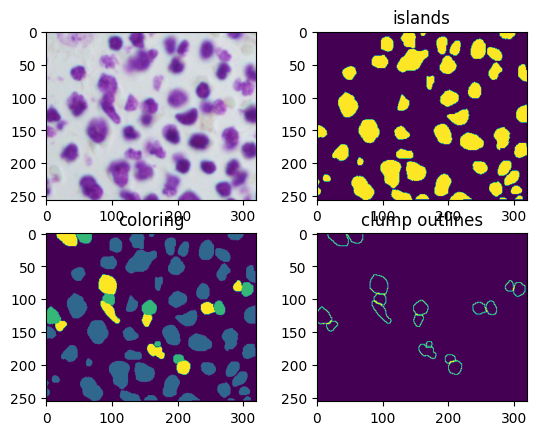

In [158]:
plt.subplot(2,2,1)
plt.imshow(img)

plt.subplot(2,2,2)
plt.imshow(msk_2c[...,0])
plt.title('islands')

plt.subplot(2,2,4)
plt.imshow(msk_2c[...,1])
plt.title('clump outlines')

plt.subplot(2,2,3)
plt.imshow(lbl_cl)
plt.title('coloring')

In [159]:
lbl_cl_ohe = to_onehot(lbl_cl)


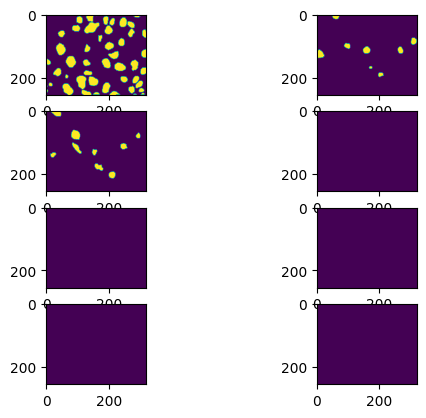

In [160]:
for ii in range(8):
    plt.subplot(4,2,ii+1)
    plt.imshow(lbl_cl_ohe[...,ii])

In [106]:
coco['annotations']

[{'label': 1,
  'bbox': [15, 0, 42, 10],
  'bbox_mode': 0,
  'category_id': 0,
  'segmentation': [[[41.5, 0.0],
    [41.5, 1.0],
    [41.5, 2.0],
    [41.5, 3.0],
    [41.5, 4.0],
    [41.5, 5.0],
    [41.5, 6.0],
    [41.0, 6.5],
    [40.5, 7.0],
    [40.0, 7.5],
    [39.0, 7.5],
    [38.5, 8.0],
    [38.0, 8.5],
    [37.0, 8.5],
    [36.5, 9.0],
    [36.0, 9.5],
    [35.0, 9.5],
    [34.0, 9.5],
    [33.0, 9.5],
    [32.0, 9.5],
    [31.0, 9.5],
    [30.0, 9.5],
    [29.0, 9.5],
    [28.0, 9.5],
    [27.5, 9.0],
    [27.0, 8.5],
    [26.5, 8.0],
    [26.0, 7.5],
    [25.0, 7.5],
    [24.5, 7.0],
    [24.0, 6.5],
    [23.0, 6.5],
    [22.5, 6.0],
    [22.0, 5.5],
    [21.0, 5.5],
    [20.5, 5.0],
    [20.0, 4.5],
    [19.5, 4.0],
    [19.0, 3.5],
    [18.5, 3.0],
    [18.0, 2.5],
    [17.0, 2.5],
    [16.5, 2.0],
    [16.0, 1.5],
    [15.5, 1.0],
    [15.0, 0.5],
    [14.5, 0.0]]]},
 {'label': 2,
  'bbox': [0, 136, 11, 162],
  'bbox_mode': 0,
  'category_id': 0,
  'segmentation': [[[0

In [65]:
# poly_rc[0]

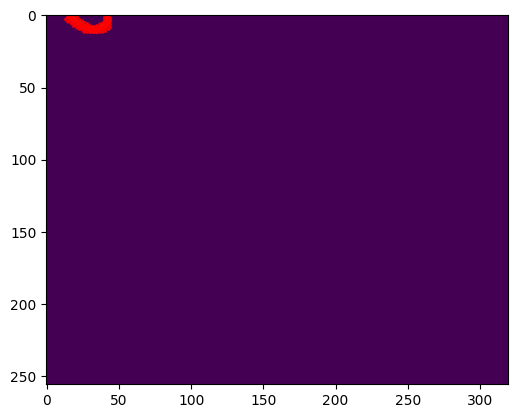

In [62]:
plt.imshow(bound_img)
plt.plot(poly_xy[0][:,0],poly_xy[0][:,1],'rx')

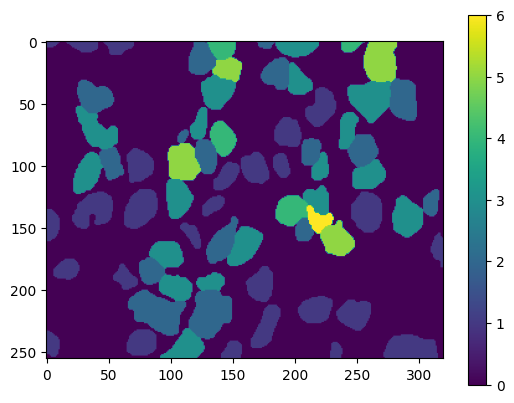

In [24]:
plt.imshow(lbl_cl)
plt.colorbar()

In [25]:
lbl_cl_total = get_coloring(lbl,per_subgraph=False)

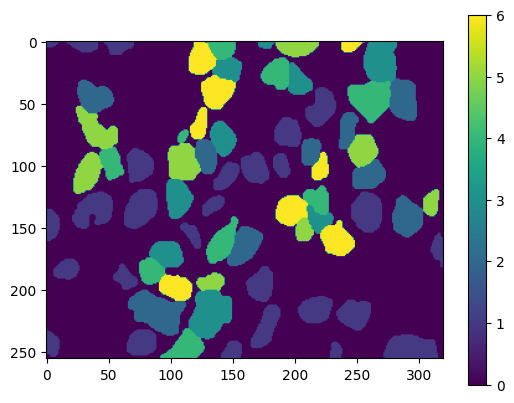

In [26]:
plt.imshow(lbl_cl_total)
plt.colorbar()

In [76]:
lbl_cl_ohe = to_onehot(lbl_cl)

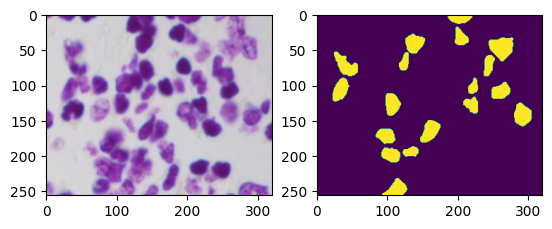

In [77]:
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(lbl_cl_ohe[...,3])

In [78]:
lbl_cl_total_ohe = to_onehot(lbl_cl_total)

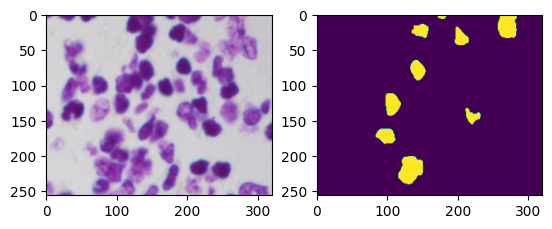

In [79]:
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(lbl_cl_total_ohe[...,3])

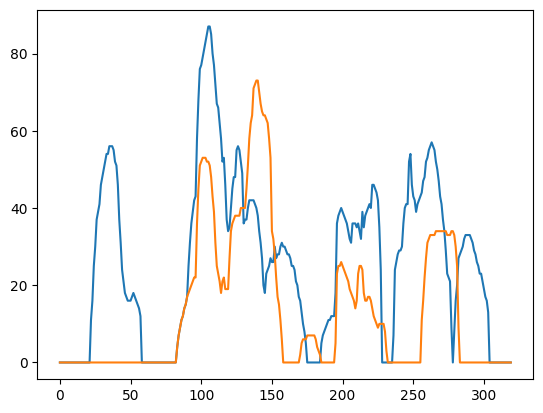

In [80]:
plt.plot(lbl_cl_ohe[...,3].sum(axis=0))
plt.plot(lbl_cl_total_ohe[...,3].sum(axis=0))

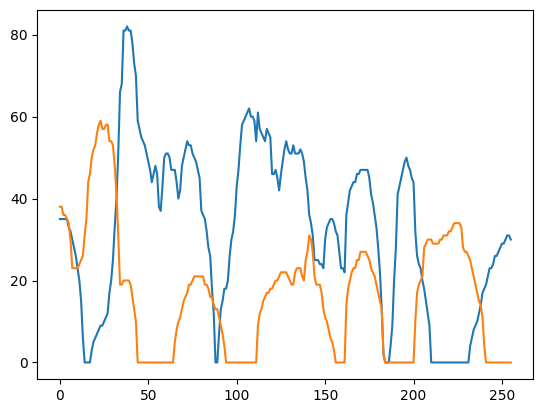

In [81]:
plt.plot(lbl_cl_ohe[...,3].sum(axis=1))
plt.plot(lbl_cl_total_ohe[...,3].sum(axis=1))

In [209]:
gr.edges

EdgeView([(56, 21), (56, 31), (21, 31), (11, 28), (22, 23), (23, 9), (23, 18), (31, 8), (19, 60), (9, 18), (29, 25), (25, 48), (20, 39), (63, 53), (41, 39), (51, 42), (53, 3), (61, 62), (39, 42), (42, 65), (48, 12), (67, 68), (67, 45), (10, 55), (68, 45), (68, 66), (45, 66), (45, 6), (57, 30), (4, 34), (34, 70), (50, 38), (70, 69), (38, 14)])

In [210]:
len(gr)

70

In [211]:
gr.degree

DegreeView({33: 0, 1: 0, 15: 0, 56: 2, 21: 2, 11: 1, 28: 1, 22: 1, 23: 3, 31: 3, 19: 1, 60: 1, 8: 1, 9: 2, 29: 1, 18: 2, 59: 0, 25: 2, 20: 1, 63: 1, 35: 0, 41: 1, 51: 1, 53: 2, 61: 1, 39: 3, 42: 3, 48: 2, 47: 0, 12: 1, 7: 0, 62: 1, 46: 0, 3: 1, 37: 0, 65: 1, 67: 2, 43: 0, 10: 1, 58: 0, 17: 0, 44: 0, 68: 3, 55: 1, 45: 4, 2: 0, 57: 1, 66: 2, 6: 1, 36: 0, 30: 1, 13: 0, 4: 1, 34: 2, 64: 0, 24: 0, 32: 0, 50: 1, 70: 2, 69: 1, 38: 2, 52: 0, 54: 0, 27: 0, 14: 1, 5: 0, 40: 0, 26: 0, 16: 0, 49: 0})

In [213]:
islands

[1,
 2,
 5,
 7,
 13,
 15,
 16,
 17,
 24,
 26,
 27,
 32,
 33,
 35,
 36,
 37,
 40,
 43,
 44,
 46,
 47,
 49,
 52,
 54,
 58,
 59,
 64]

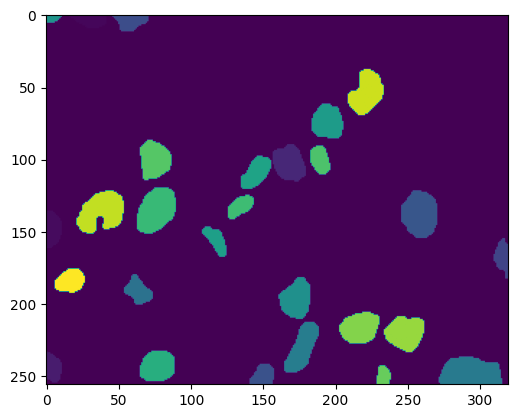

In [215]:
plt.imshow(lbl_islands)

In [216]:
gr.degree

DegreeView({56: 2, 21: 2, 11: 1, 28: 1, 22: 1, 23: 3, 31: 3, 19: 1, 60: 1, 8: 1, 9: 2, 29: 1, 18: 2, 25: 2, 20: 1, 63: 1, 41: 1, 51: 1, 53: 2, 61: 1, 39: 3, 42: 3, 48: 2, 12: 1, 62: 1, 3: 1, 65: 1, 67: 2, 10: 1, 68: 3, 55: 1, 45: 4, 57: 1, 66: 2, 6: 1, 30: 1, 4: 1, 34: 2, 50: 1, 70: 2, 69: 1, 38: 2, 14: 1})

In [323]:
len(gr)

43

In [325]:
subgraphs[0].adj

AdjacencyView({56: {21: {}, 31: {}}, 8: {31: {}}, 21: {56: {}, 31: {}}, 31: {56: {}, 8: {}, 21: {}}})

In [364]:
max(dict(gr.degree).values())

4

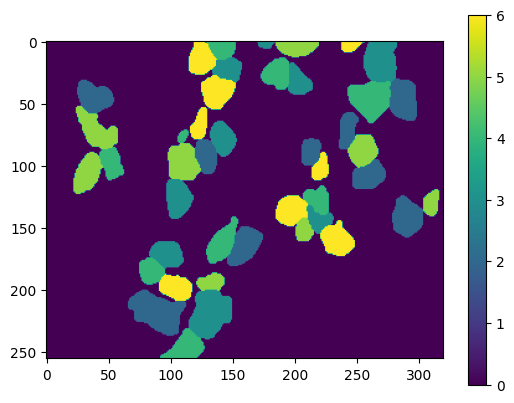

In [467]:
plt.imshow(lbl_total)
plt.colorbar()

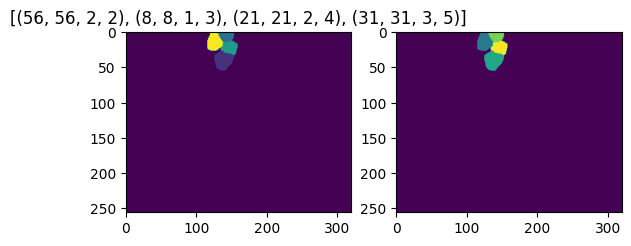

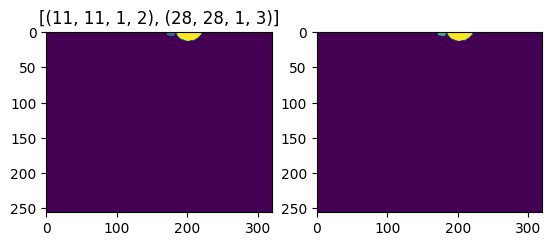

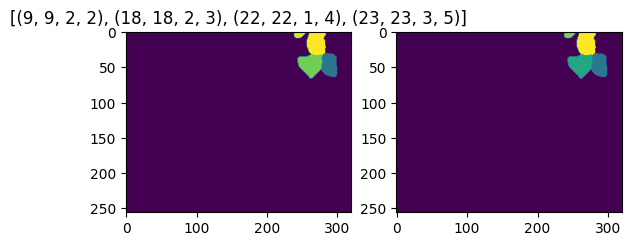

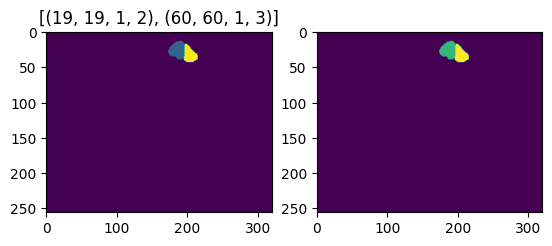

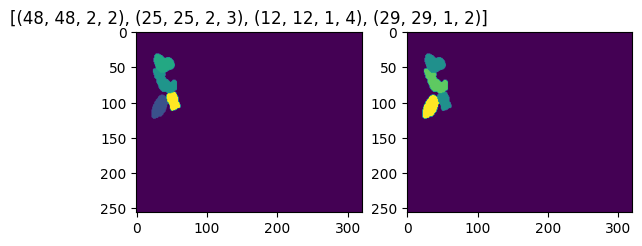

...

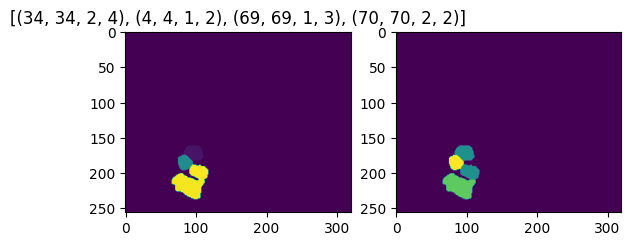

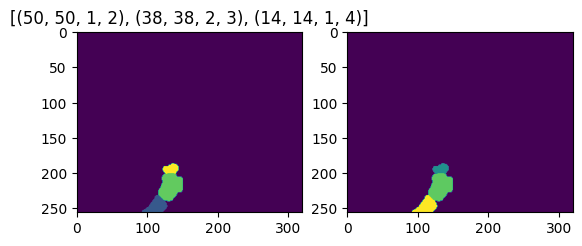

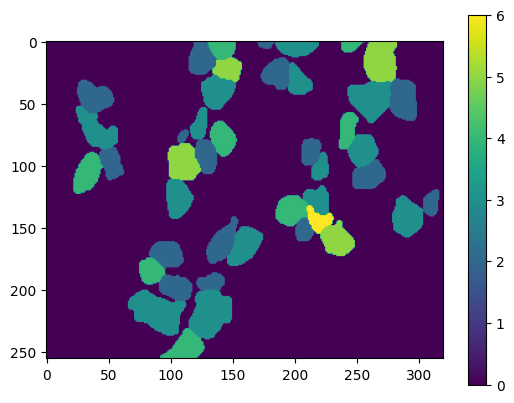

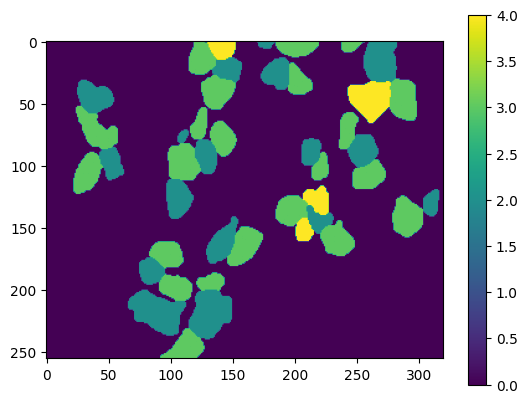

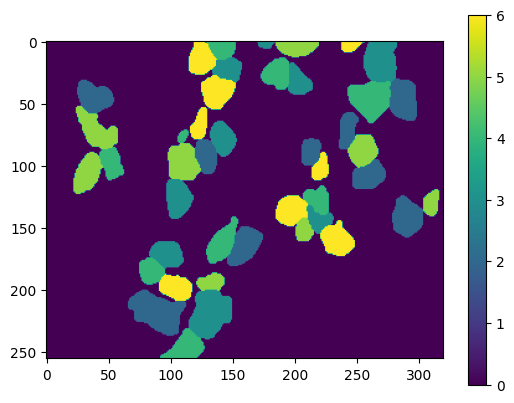

In [468]:
merged = np.zeros(lbl.shape,np.uint8)
merged_default = np.zeros(lbl.shape,np.uint8)

for subgr in subgraphs:
    
    sel = list(subgr)
    grp = np.where(np.logical_or.reduce([lbl==x for x in sel]), lbl, 0) 
    
    coloring_default = networkx.coloring.greedy_color(subgr,strategy='largest_first')
    # coloring_default = networkx.coloring.equitable_color(subgr,8)
    
    for nd,cl in coloring_default.items():
        merged_default = np.where(grp==nd,cl+2,merged_default)
    
    if False: # coloring is not impacted by relabeling
        props = regionprops_table(grp)
        props_sorted=pd.DataFrame(props).sort_values(by=['bbox-0','bbox-1'])
        old = props_sorted['label'].values
        mapping = {old[ii]:ii+1 for ii in range(len(old))} # avoid 0

        subgr2 = networkx.relabel_nodes(subgr,mapping)
    else:
        subgr2 = subgr
        mapping = {x:x for x in sel}
        
    # coloring = networkx.coloring.greedy_color(subgr2,strategy='connected_sequential_dfs')
    coloring = networkx.coloring.equitable_color(subgr2,min(8,max(dict(subgr2.degree).values())+1))
    plt.figure()
    
    relabeled = np.zeros(grp.shape,np.uint8)
    for old,new in mapping.items():
        relabeled = np.where(lbl==old,coloring[new]+2,relabeled) # leave 0(bg),1(islands)
    merged = merged+relabeled
    plt.subplot(1,2,1)
    plt.imshow(grp)
    plt.title(str([(elt,mapping[elt],subgr2.degree[mapping[elt]],coloring[mapping[elt]]+2) for elt in sel]))
    plt.subplot(1,2,2)
    plt.imshow(relabeled)
    # break

plt.figure()
plt.imshow(merged) #+(lbl_islands>0))
plt.colorbar()

plt.figure()
plt.imshow(merged_default) #+(lbl_islands>0))
plt.colorbar()

plt.figure()
plt.imshow(lbl_total) #+(lbl_islands>0))
plt.colorbar()


In [378]:
LBL,cnt=np.unique(merged,return_counts=True) # equitable on each subgraph
LBL,cnt

(array([0, 2, 3, 4, 5, 6], dtype=uint8),
 array([62291,  5960,  7951,  3107,  2339,   272], dtype=int64))

In [357]:
np.unique(merged_default,return_counts=True) # greedy

(array([0, 2, 3, 4], dtype=uint8),
 array([62291,  7883, 10043,  1703], dtype=int64))

In [469]:
np.unique(lbl_total,return_counts=True) # equitable on total graph

(array([0, 2, 3, 4, 5, 6], dtype=uint8),
 array([62291,  5015,  4315,  3753,  3393,  3153], dtype=int64))

In [358]:
# handle islands separately; lab_gt has only non-islands

def compare_labeling(lab,lab_gt): # coloring, instance label map
    # compare:
    # instances delineated by labeling transitions
    # integrity of instances (one by one dice)
    
    # proxy: coloring , coloring
    # consistency of labeling ( agreement of one-hot allowing assignment permutations )
    pass


confusion = lambda lab,lab_gt : confusion_matrix(lab_gt.ravel(),lab.ravel())

def sameness(lab,lab_gt):
    gtcolors = np.unique(lab_gt)
    for color in gtcolors:
        channel = lab_gt==color
        inters = lab[channel]
        intc,cnt = np.unique(inters,return_counts=True)
        print(color,intc,cnt)

In [365]:
C = confusion(merged_default,merged)
C

array([[62291,     0,     0,     0,     0,     0],
       [    0,  2999,  2742,   219,     0,     0],
       [    0,  3114,  3648,  1189,     0,     0],
       [    0,   346,  2466,   295,     0,     0],
       [    0,  1152,  1187,     0,     0,     0],
       [    0,   272,     0,     0,     0,     0]], dtype=int64)

In [361]:
C.sum(axis=0) # cols are pred

array([62291,  7883, 10043,  1703,     0,     0], dtype=int64)

In [362]:
C.sum(axis=1) # rows are GT

array([62291,  5960,  7951,  3107,  2339,   272], dtype=int64)

In [367]:
C.argmax(axis=1)

array([0, 1, 2, 2, 2, 1], dtype=int64)

In [370]:
from sklearn.metrics import (
    cohen_kappa_score, balanced_accuracy_score, hinge_loss, matthews_corrcoef, hamming_loss,
    jaccard_score, log_loss, 
)

In [415]:
LBL[...,np.newaxis].shape

(6, 1)

In [430]:
from sklearn.preprocessing import OneHotEncoder
pred = merged_default.ravel()[...,np.newaxis]
enc = OneHotEncoder(categories=[LBL],sparse=False) 

enc.fit(LBL[...,np.newaxis])
pred_ohe =enc.transform(pred)

In [449]:
pred.shape,pred_ohe.shape

((81920, 1), (81920, 6))

In [434]:
type(pred_ohe)

numpy.ndarray

In [439]:
gt = merged.ravel()[...,np.newaxis]
hinge_loss(gt,pred_ohe,labels=LBL)

0.3097412109375

In [443]:
balanced_accuracy_score(gt,pred)

0.34282417102084023

In [444]:
cohen_kappa_score(gt,pred)

0.6148661713645349

In [442]:
matthews_corrcoef(gt,pred)

0.6166761934220735

In [445]:
hamming_loss(gt,pred)

0.15487060546875

In [447]:
jaccard_score(gt,pred,average='macro')

0.26603052296100965

In [454]:
gt.shape

(81920, 1)

In [461]:
log_loss(gt,pred_ohe) #,labels=LBL)

5.349041212429592

In [348]:
from scipy.spatial import distance

In [351]:
distance.dice((merged_default==2).ravel(),(merged==2).ravel())

0.4290168004156804

In [352]:
from sklearn.metrics import f1_score

In [354]:
1-f1_score((merged_default==2).ravel(),(merged==2).ravel())

0.42901680041568035

In [342]:
sameness(merged_default, merged)

0 [0] [62291]
2 [2 3 4] [4945 3926  567]
3 [2 3 4] [2321 6117  295]
4 [2 4] [617 841]


In [142]:
deg = np.array(gr.degree)
maxdegnode,maxdeg = deg[deg[:,1].argmax(),:]


In [144]:
maxdegnode,maxdeg

(45, 4)

In [128]:
import networkx

coloring_sl = networkx.coloring.greedy_color(gr,strategy='smallest_last')
coloring_lf = networkx.coloring.greedy_color(gr,strategy='independent_set')